# Instacart - Market Analysis


* [1. Libraries](#lib)
* [2. Datasets](#data)
* [3. Exploratory Data Analysis](#eda)
   * [Product and Orders](#prod)
   * [Time of Purchase](#time)
   * [Reorder Behavior](#reo)

<hr>
<a id="lib">

## 1. Libraries
    
</a>

In [2]:
#pip install dtale

In [3]:
import pandas as pd
import numpy as np
import datetime as dt
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import dtale
import plotly.graph_objects as go

import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
#pip install cufflinks --upgrade

<hr>
<a id="data">

## 2. Datasets
    
</a>

In [4]:
orders_df = pd.read_csv('orders.csv') #order date / hour 
order_products_df = pd.read_csv('order_products.csv') # product in order 
departments_df = pd.read_csv('departments.csv') #department name
products_df = pd.read_csv('products.csv') # product name + department ID 

In [5]:
df = pd.merge(order_products_df, products_df, how='left', on='product_id')
df.head()

,order_id,product_id,add_to_cart_order,reordered,department_id,product_name
0,10,24,1,1,4,fresh fruits
1,10,83,2,1,4,fresh vegetables
2,10,16,3,0,4,fresh herbs
3,10,24,4,1,4,fresh fruits
4,10,83,5,1,4,fresh vegetables


<hr>
<a id="eda">

## 3. Exploratory Data Analysis
    
</a>

In this step our purpose is to identify consumer's behavior : 
- What do the customers mostly purchase ? 
- When do the customers usually order ?
- Which product gets reordered frequently ? 

<hr>
<a id="prod">

### Products and Orders
    
</a>

# Q : What do customer mostly purchase ? 

### Most Popular Departments

In [6]:
df_total = pd.merge(df, departments_df, how='left', on='department_id')
df_total.head()

,order_id,product_id,add_to_cart_order,reordered,department_id,product_name,department
0,10,24,1,1,4,fresh fruits,produce
1,10,83,2,1,4,fresh vegetables,produce
2,10,16,3,0,4,fresh herbs,produce
3,10,24,4,1,4,fresh fruits,produce
4,10,83,5,1,4,fresh vegetables,produce


In [7]:
df_total.sort_values("department_id", inplace=True)

In [8]:
dep = pd.DataFrame(df_total["department"].value_counts())

In [9]:
dep["percentage"] = dep['department']/dep['department'].sum()*100

In [10]:
# Pie chart of proportionality of all departments based on the orders
fig = px.pie(dep, values="percentage", names=dep["department"].index.tolist(), 
             color_discrete_sequence = px.colors.sequential.YlOrBr_r)
             
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide', 
                 title="Proportionality of Departments")
fig.show()

In [11]:

# Distribution of each department with sales
fig = px.bar(x=dep["department"].index.tolist(), y = dep["department"])
fig.update_traces(textposition='inside', marker_color='#81b214')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide', 
                 title="Department's Popularity",
                 xaxis_title = 'Departments',
                 yaxis_title = 'Count ',
                 title_x=0.5)

fig.update_layout(
    #paper_bgcolor='rgba(0,0,0,0)',
    #plot_bgcolor='#F8F8F8'
)

#fig.update_yaxes(showline=True, linewidth=1, linecolor='#364547', gridcolor='#364547')

fig.show()

In [12]:
df_total[df_total["department"]=="produce"]["product_name"].value_counts()

fresh fruits                  226039
fresh vegetables              212611
packaged vegetables fruits    109596
fresh herbs                    23342
packaged produce               17408
Name: product_name, dtype: int64

### How frequently products are ordered and reordered from each departments ?

In [13]:
# Merge product labels
op_merged = pd.merge(order_products_df, products_df, how='left', on='product_id')
op_merged = pd.merge(op_merged, departments_df, on='department_id', how='left')

op_merged.head()
color=sns.color_palette()

In [14]:
temp_df = op_merged.groupby("department")["reordered"].agg(['count', 'sum']).rename(columns = {'count':'total','sum':'reorders'})
temp_df = temp_df.sort_values('total', ascending=False).reset_index()

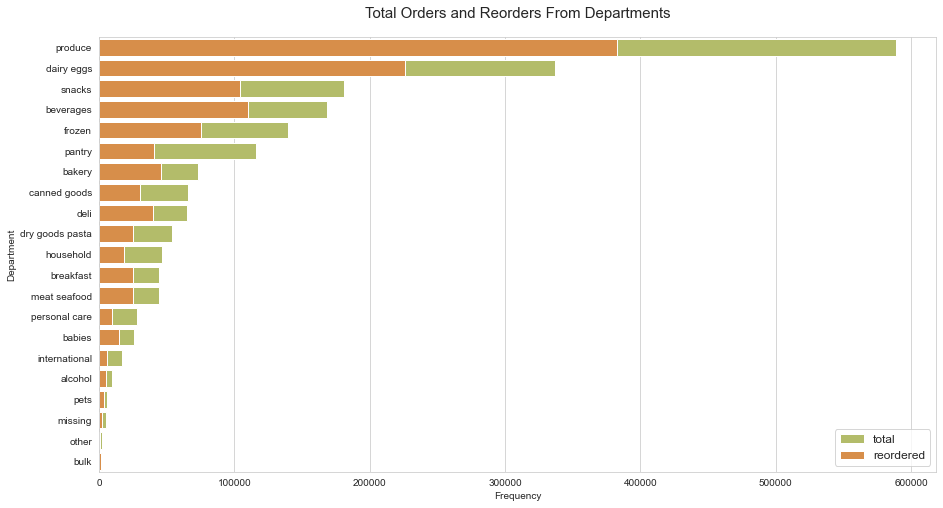

In [15]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize = (15,8))
ax = sns.barplot(y = temp_df.department, x = temp_df["total"], color="#beca5c", label = "total")
ax = sns.barplot(y = temp_df.department, x = temp_df["reorders"], color="#ef8d32", label = "reordered")
ax.set_ylabel("Department")
ax.set_xlabel("Frequency")
ax.legend(loc = 4, prop={'size': 12})
ax.set_title("Total Orders and Reorders From Departments", fontsize=15, y=1.03)
plt.show()

fig.savefig('temp.png', transparent=True)

### Product belonging to departments

In [16]:
#Treemap of the department with each product name
fig = px.treemap(df_total, path=["department", 'product_name'])
fig.update_layout(title="Treemap of department with products", 
                )
                 
fig.show()

In [17]:
df_total["product_name"].value_counts().head(10)

fresh fruits                     226039
fresh vegetables                 212611
packaged vegetables fruits       109596
yogurt                            90751
packaged cheese                   61502
milk                              55150
water seltzer sparkling water     52564
chips pretzels                    45306
soy lactosefree                   39389
bread                             36381
Name: product_name, dtype: int64

### Popularity of Product inside Departments

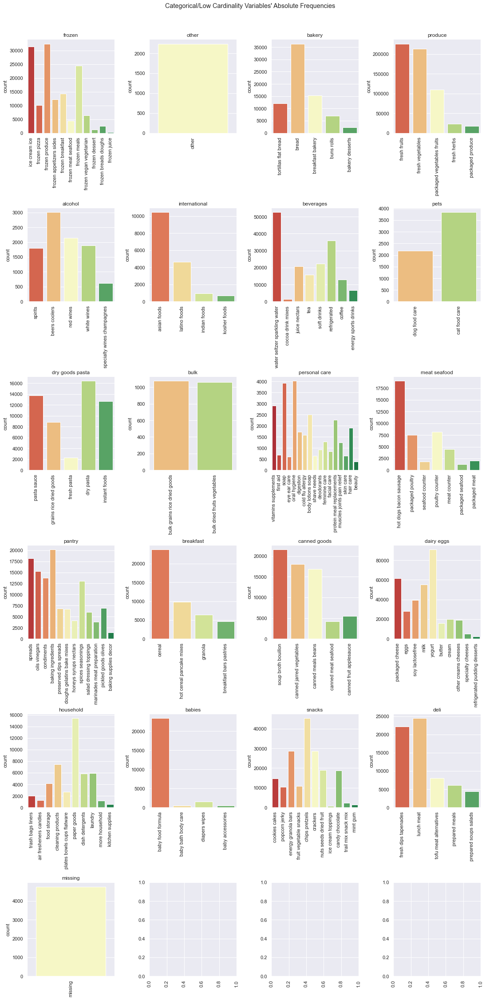

In [18]:

# All Non-Metric/ Low Cardinality Variables' Absolute Frequencies
sns.set()

features = df_total["department"].unique().tolist()
# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(6, 4, figsize=(15, 30))
fig.tight_layout()
# Plot data
# Iterate across axes objects and associate each bar plot:
for ax, feat in zip(axes.flatten(), features):
    sns.countplot(x=df_total[df_total["department"]==feat]["product_name"], ax=ax, 
                  palette="RdYlGn")
    ax.title.set_text(feat)

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title, y=1.03)
# Rotating X-axis labels
for ax in fig.axes:
    plt.sca(ax)
    plt.xticks(rotation=90)
    plt.xlabel("")
    
plt.subplots_adjust(wspace=0.4, hspace=0.8)

plt.show()
    

### Probability of Purchasing From a Department

In [19]:
dep_prob = []
for dep in df.department_id.unique():
    dep_prob = np.append(dep_prob, 100*df.department_id.value_counts()[dep]/df.shape[0])

In [20]:
dep_prob_df = pd.DataFrame(df.department_id.unique())
dep_prob_df['Probabilities'] = dep_prob

In [21]:
dep_prob_df.rename(columns = {0:"department_id"}, inplace=True)

In [22]:
dep_prob_df= dep_prob_df.sort_values("department_id")

In [23]:
dep_prob_df = dep_prob_df.merge(departments_df, on="department_id")
dep_prob_df.sort_values("Probabilities", ascending=False, inplace=True)
dep_prob_df

,department_id,Probabilities,department
3,4,29.165423,produce
15,16,16.683082,dairy eggs
18,19,8.947359,snacks
6,7,8.325126,beverages
0,1,6.909430,frozen
12,13,5.756967,pantry
2,3,3.613913,bakery
14,15,3.270758,canned goods
19,20,3.227332,deli
8,9,2.676602,dry goods pasta


In [24]:
fig = px.bar(x=dep_prob_df["department"], y = dep_prob_df["Probabilities"])
fig.update_traces(textposition='inside', marker_color='#beca5c')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide', 
                 title="Probability of buying from departments",
                 xaxis_title = "Departments",
                 yaxis_title = " Percentage of Probability")
fig.show()



# Q : How much items are in an Order ? 

In [25]:
products_order = df.groupby(["order_id"]).size()
products_order.mean()

10.097505

In [26]:
fig = go.Figure()
fig.add_trace(go.Box(
    x=products_order,
    name="Number of Items",
    boxpoints='suspectedoutliers', # only suspected outliers
    marker=dict(
        color='#f58634',
        outliercolor='#ffcc29',
        line=dict(
            outliercolor='#ffcc29',
            outlierwidth=2)),
    line_color='#f58634'
))
fig.update_layout(title = "Number of Items in Order",
                 xaxis_title="Total Number of Items")

# Q : How many orders were placed by every user ?

In [27]:
orders_by_user = orders_df.groupby('user_id')['order_number'].max()

min_ord= min(orders_by_user)
max_ord= max(orders_by_user)
print("The maximum orders by user is {} and the minimum orders by user is {} " .format(max_ord, min_ord))



The maximum orders by user is 100 and the minimum orders by user is 1 


In [28]:
# how many time a user order?

orders_df.groupby('user_id').agg({'order_number' :  'max'})['order_number'].value_counts().iplot(kind = 'bar',
                                                                                                 title = 'Maximum order Number')

For every user we have around 4–100 order details.
the Histogram shows that there are very few users who have placed orders more than 60 , and maximum order for any user is 100.

In [29]:
products_by_user = orders_df[['order_id', 'user_id']].merge(
    order_products_df[['order_id', 'add_to_cart_order']].groupby('order_id').max().rename({'add_to_cart_order': 'size_of_order'}, axis = 1),
                                                                                        on = 'order_id')

products_by_user = products_by_user.drop('order_id', axis = 1).groupby('user_id')['size_of_order'].sum()


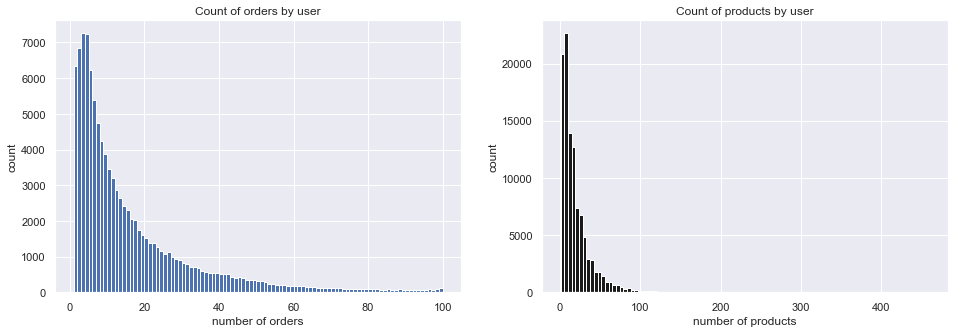

In [30]:
fig, ax = plt.subplots(1, 2, figsize=(16,5))
ax[0].hist(orders_by_user, bins = max(orders_by_user) - min(orders_by_user))
ax[0].set_title('Count of orders by user')
ax[0].set_xlabel('number of orders')
ax[0].set_ylabel('count')

#Q : What is the cart size on different orders ?


ax[1].hist(products_by_user, bins = 100, color='k')
ax[1].set_title('Count of products by user')
ax[1].set_xlabel('number of products')
ax[1].set_ylabel('count');

We have a right skewed distribution of maximum cart size for every order
There are 237225 orders with cart size = 5, also, mode = 5.
There are very few order with cart size > 40 and all the way up to 145.

<hr>
<a id="time">

### Time of Purchase
    
</a>

# Q : When do customer mostly order ? 

## By day

In [31]:
# day of the week number turn to object 
orders_df['Weekday'] = orders_df['order_dow'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu',6:'Fri',0:'Sat'})

In [32]:
fig = px.histogram(orders_df.sort_values('order_dow'), x='Weekday', 
                   title = "Total of Order by Day")
fig.update_traces(marker_color='#ef8d32')
fig.show()

## By Hour

In [33]:
fig = px.histogram(orders_df, x='order_hour_of_day')
            
fig.update_layout(
    title_text='Total Number of Order by Hour', # title of plot
    xaxis_title_text='Hour of the Day', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1 # gap between bars of the same location coordinates
)

fig.update_traces(marker_color='#beca5c')
    
fig.show()

## Overview

In [34]:
date = pd.DataFrame(orders_df["order_hour_of_day"].groupby(orders_df["Weekday"]).value_counts())

In [35]:
date.sort_index(inplace=True)
#date.rename(columns = {"order_hour_of_day" : "total"}, inplace=True)
#date.reset_index(inplace=True)

In [36]:
import chart_studio.plotly as py
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Histogram(x=orders_df['order_hour_of_day'], name="Total orders"))  
fig.update_layout(
    title_text='Total Number of Order by Hour', # title of plot
    xaxis_title_text='Hour of the Day', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1, # gap between bars of the same location coordinates
)
fig.update_traces(marker_color='#beca5c')

fig.add_trace(go.Scatter(x=date.xs('Sat').index, y= date.xs('Sat')["order_hour_of_day"],
                                mode='lines', name="Saturday",line=dict(color="#f58634")), secondary_y=True)
fig.add_trace(go.Scatter(x=date.xs('Sun').index, y= date.xs('Sun')["order_hour_of_day"],
                                mode='lines', name="Sunday", line=dict(color="#ffcc29")), secondary_y=True)
fig.add_trace(go.Scatter(x=date.xs('Mon').index, y= date.xs('Mon')["order_hour_of_day"],
                                mode='lines', name="Monday", line=dict(color="#d49d42")), secondary_y=True)
fig.add_trace(go.Scatter(x=date.xs('Tue').index, y= date.xs('Tue')["order_hour_of_day"],
                                mode='lines', name="Tuesday",line=dict(color="#f7ea00")), secondary_y=True)
fig.add_trace(go.Scatter(x=date.xs('Wed').index, y= date.xs('Wed')["order_hour_of_day"],
                                mode='lines', name="Wednesday",line=dict(color="#d44000")), secondary_y=True)
fig.add_trace(go.Scatter(x=date.xs('Thu').index, y= date.xs('Thu')["order_hour_of_day"],
                                mode='lines', name="Thursday",line=dict(color="#f0c929")), secondary_y=True)
fig.add_trace(go.Scatter(x=date.xs('Fri').index, y= date.xs('Fri')["order_hour_of_day"],
                                mode='lines', name="Friday",line=dict(color="#c06014")), secondary_y=True)

        
fig.show()

In [37]:
orders_df.groupby(['order_dow', 'order_hour_of_day']).agg({'order_number' : 'count'}).iplot()


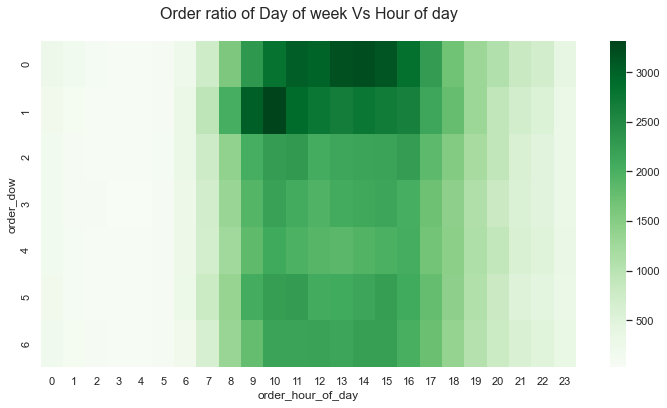

In [38]:
grouped_df = orders_df.groupby(['order_dow', 'order_hour_of_day']).agg({'order_number' : 'count'}).reset_index()
grouped_df = grouped_df.pivot('order_dow', 'order_hour_of_day', 'order_number')

plt.figure(figsize=(12,6))
sns.heatmap(grouped_df, cmap="Greens")

plt.title("Order ratio of Day of week Vs Hour of day", fontsize = 16, y =1.05)
plt.show()



In [39]:
grouped_df = orders_df.groupby(['order_dow', 'order_hour_of_day']).agg({'order_number' : 'count'}).reset_index()
grouped_df = grouped_df.pivot('order_dow', 'order_hour_of_day', 'order_number')
grouped_df.iplot(kind='heatmap',colorscale='-rdylgn', title = 'No. of order on various Time of day and days of week',
                 xTitle = 'Order Day of Week', yTitle = 'Order Time of day')

#So seems at day 0 and 1 and between 9 in morning to 5 in evening most of order been placed.

From the overview of the different visualizations, we can see that most customers from instacart prefer to order on the week end. Looking at the entire week most orders are made between 10 in the morning until 4 pm.

# Q : How much days are in between orders ? 

In [40]:
#Days since prior order = nan - first time buyers
orders_df[orders_df['days_since_prior_order'].isna()]

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,Weekday
0,2425083,49125,1,2,18,NaN,Mon
1,1944304,162867,1,3,17,NaN,Tue
6,1378095,73110,1,6,10,NaN,Fri
12,763857,195070,1,5,2,NaN,Thu
46,49056,14451,1,1,11,NaN,Sun
...,...,...,...,...,...,...,...
199933,169343,179472,1,4,16,NaN,Wed
199961,1328634,141083,1,6,13,NaN,Fri
199970,1294790,151137,1,1,10,NaN,Sun
199977,89567,35113,1,3,6,NaN,Tue


In [41]:
fig = px.histogram(orders_df, x='days_since_prior_order')
            
fig.update_layout(
    title_text='Number of Days Before Last Order', # title of plot
    xaxis_title_text='Number of the Day', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1 # gap between bars of the same location coordinates
)

fig.update_traces(marker_color='#ef8d32')
    
fig.show()

Most people restock after a week or a month. It seems, some people prefer buy a week / month supplies at once.
People who are buying at Day 0, are probably new customers, but we can see a small rate of reorder implying that users tend to place multiple orders on Day 0 too.
Probably here 30 days represents the upper limit, and not necessarily any particular month.
There is a continuous spike in orders from day 1 to day 6, shows that some people are frequent buyers with short window of restocking.

<hr>
<a id="reo">

### Reorder Behavior
    
</a>

# Q: How many Orders with no reordered products ?

In [42]:
orders_count  = order_products_df.groupby(['order_id'])['reordered'].sum().reset_index(name ='counts')
orders_reorder, order_no_reorder = sum(orders_count['counts']!=0), sum(orders_count['counts']==0)

print("Order with reorder: ", orders_reorder/order_products_df['order_id'].nunique())
print("Order with no reorder: ", order_no_reorder/order_products_df['order_id'].nunique())

#12 % of orders have no reordered items, while rest ~88 % of orders contains reordered items

Order with reorder:  0.88172
Order with no reorder:  0.11828


# Q: Which are the most frequently ordered / reordered products ?

### Total of Orders and Reorders Product (Most and Least Popular)

In [43]:
print("there are total {} different products".format(products_df['product_name'].nunique()))

there are total 134 different products


In [44]:
temp_df = op_merged.groupby("department")["reordered"].agg(['count', 'sum']).rename(columns = {'count':'total','sum':'reorders'})
temp_df = temp_df.sort_values('total', ascending=False).reset_index()
temp_df = df.groupby("product_name")["reordered"].agg(['count', 'sum']).rename(columns = {'count':'total','sum':'reorders'})
temp_df = temp_df.sort_values('total', ascending=False).reset_index()

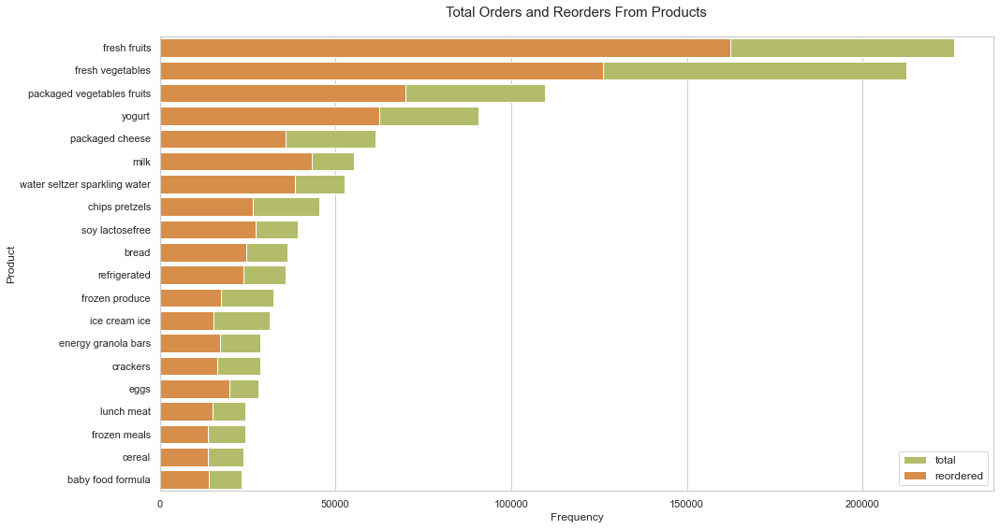

In [45]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize = (15,8))
ax = sns.barplot(y = temp_df.product_name[0:20], x = temp_df["total"], color='#beca5c', label = "total")
ax = sns.barplot(y = temp_df.product_name[0:20], x = temp_df["reorders"], color="#ef8d32", label = "reordered")
ax.set_ylabel("Product")
ax.set_xlabel("Frequency")
ax.legend(loc = 4, prop={'size': 12})
ax.set_title("Total Orders and Reorders From Products", fontsize=15, y=1.03)

plt.tight_layout()
fig.savefig('eda3.png', transparent=True)

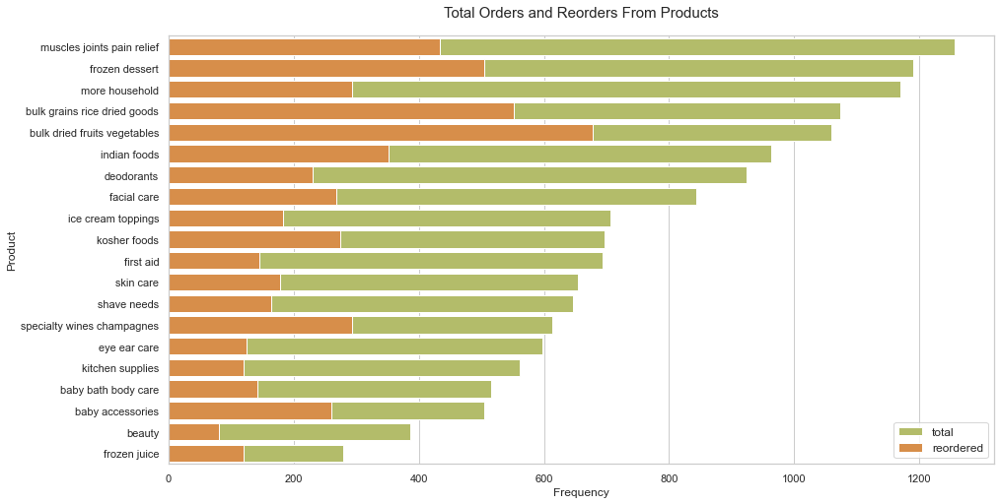

In [46]:
fig, ax = plt.subplots(figsize = (15,8))
ax = sns.barplot(y = temp_df.product_name[114:], x = temp_df["total"], color='#beca5c', label = "total")
ax = sns.barplot(y = temp_df.product_name[114:], x = temp_df["reorders"], color="#ef8d32", label = "reordered")
ax.set_ylabel("Product")
ax.set_xlabel("Frequency")
ax.legend(loc = 4, prop={'size': 12})
ax.set_title("Total Orders and Reorders From Products", fontsize=15, y=1.03)
plt.show()

In [47]:
# Merge product labels
op_merged = pd.merge(order_products_df, products_df, how='left', on='product_id')
op_merged = pd.merge(op_merged, departments_df, on='department_id', how='left')

op_merged.head()
color=sns.color_palette()

In [48]:
temp_df_prod = op_merged.groupby("product_name")["reordered"].agg(['count', 'sum']).rename(columns = {'count':'total','sum':'reorders'})
temp_df_prod = temp_df_prod.sort_values('total', ascending=False).reset_index()

In [49]:
temp_df_prod["reorder_ratio"] = temp_df_prod.reorders/temp_df_prod.total
temp_df_prod = temp_df_prod.sort_values("reorder_ratio", ascending=False).reset_index()

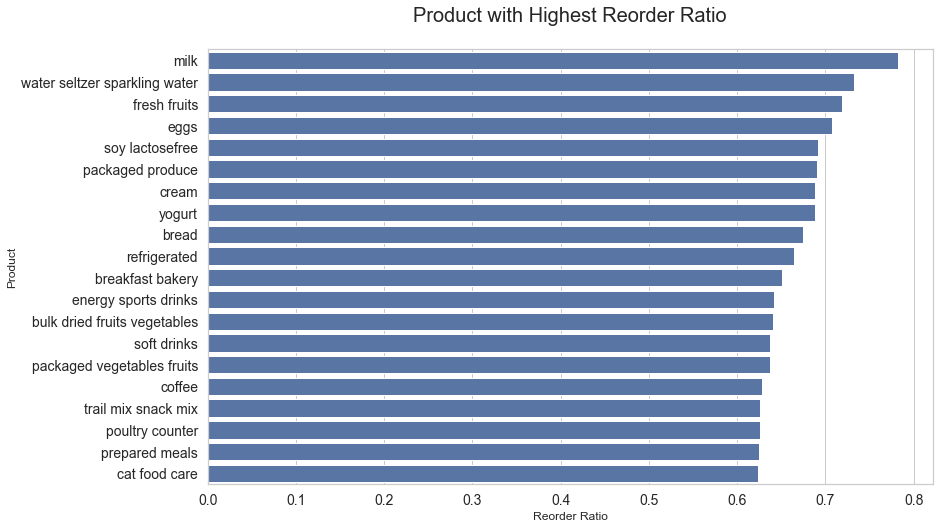

In [50]:
fig, ax = plt.subplots(figsize = (13,8))
ax = sns.barplot(y = temp_df_prod.product_name[0:20], x = temp_df_prod.reorder_ratio[0:20], color=color[0])
ax.set_ylabel("Product")
ax.set_xlabel("Reorder Ratio")
ax.set_title("Product with Highest Reorder Ratio", fontsize = 20, y=1.05)
ax.tick_params(axis = 'both', labelsize = 14)
plt.show()

As we can see, most products are ordered from Fresh Fruits and Fresh Vegetables aisles.
Other frequently ordered items are from Yogurt , Packaged Vegetables and packaged cheese aisles.
Least frequently ordered items are from Air fresheners, Baby accessories, Baby bath body care etc. aisles
Milk, sparkling water, fruits, eggs, yogurt are most common aisles the product is reordered from, as they are items which are daily consumed, and one rarely switches from their usual meal plan. Also these are the products that lasts only few days , thus high reorder rate.
On the other hand hair care, skin care, kitchen supplies are the one which lasts longer than other, hence low reorder rate.

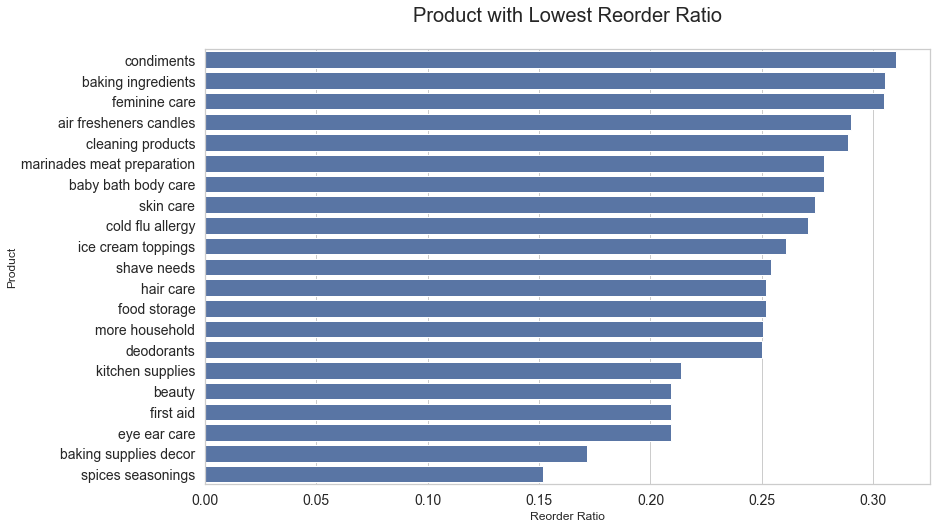

In [51]:
fig, ax = plt.subplots(figsize = (13,8))
ax = sns.barplot(y = temp_df_prod.product_name[-21:], x = temp_df_prod.reorder_ratio[-21:], color=color[0])
ax.set_ylabel("Product")
ax.set_xlabel("Reorder Ratio")
ax.set_title("Product with Lowest Reorder Ratio", fontsize = 20, y=1.05)
ax.tick_params(axis = 'both', labelsize = 14)
plt.show()

# How frequently products are ordered and reordered from each departments ?

There are total 21 departments
As seen from departments analysis , most ordered products are from produce department which have fresh vegetables, fruits, herbs etc. But most reordered product department is dairy eggs having yogurt, milk, eggs, cheese etc.
We see high reorder rate in organic foods and daily consumed items.
Low reorder rate in personal care department

In [52]:
temp_df

,product_name,total,reorders
0,fresh fruits,226039,162355
1,fresh vegetables,212611,126171
2,packaged vegetables fruits,109596,69872
3,yogurt,90751,62464
4,packaged cheese,61502,35864
...,...,...,...
129,kitchen supplies,561,120
130,baby bath body care,515,143
131,baby accessories,504,260
132,beauty,387,81


In [53]:
temp_df = op_merged.groupby("department")["reordered"].agg(['count', 'sum']).rename(columns = {'count':'total','sum':'reorders'})
temp_df = temp_df.sort_values('total', ascending=False).reset_index()
temp_df["reorder_ratio"] = temp_df.reorders/temp_df.total
temp_df = temp_df.sort_values("reorder_ratio", ascending=False).reset_index()

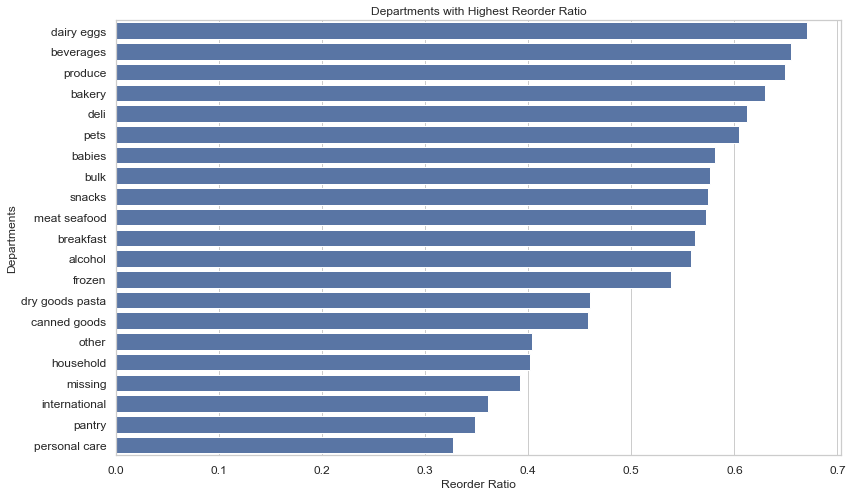

In [54]:
fig, ax = plt.subplots(figsize = (13,8))
ax = sns.barplot(y = temp_df.department, x = temp_df.reorder_ratio, color=color[0])
ax.set_ylabel("Departments")
ax.set_xlabel("Reorder Ratio")
ax.set_title("Departments with Highest Reorder Ratio")
ax.tick_params(axis = 'both', labelsize = 12)
plt.show()

In [55]:
orders_apriori = orders_df.copy()

orders_apriori.drop(['user_id', 'order_id'], axis = 1, inplace=True)
orders_by_order_number = orders_df.order_number.value_counts()



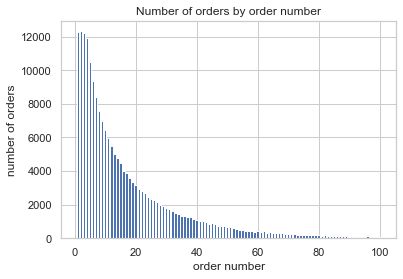

In [56]:
plt.bar(orders_by_order_number.index, orders_by_order_number)
plt.title('Number of orders by order number')
plt.xlabel('order number')
plt.ylabel('number of orders');

In [57]:
grouped_df

order_hour_of_day,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
order_dow,,,,,,,,,,,,,,,,,,,,,
0,230,153,92,44,46,71,217,759,1586,2317,...,3213,3146,2846,2273,1703,1303,1072,846,695,400
1,202,105,57,45,53,81,298,939,2035,3043,...,2770,2702,2636,2139,1773,1301,920,698,562,317
2,177,82,51,44,50,91,300,781,1409,2030,...,2170,2175,2255,1857,1530,1194,925,611,498,307
3,164,83,65,23,33,74,265,708,1326,1916,...,2109,2153,2030,1719,1434,1102,801,574,495,299
4,152,89,49,40,57,83,256,691,1262,1830,...,1947,2001,2051,1673,1458,1114,905,614,521,326
5,197,98,53,42,48,86,275,784,1351,2056,...,2158,2245,2088,1793,1435,1088,802,541,454,302
6,189,109,62,49,43,69,192,648,1325,1797,...,2233,2227,2022,1747,1383,1062,784,608,506,351


/Users/lilou_dgt/opt/anaconda3/envs/DSAA/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



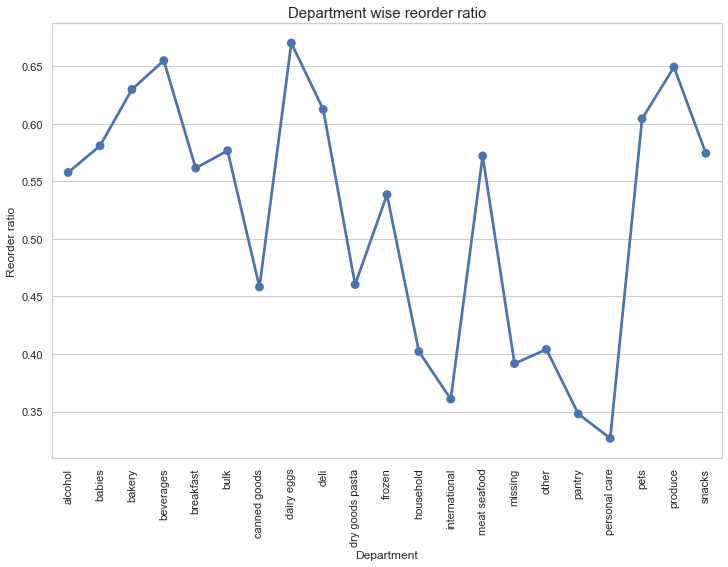

In [58]:
# Analyze the department wise reorder ratio
grouped_df=op_merged.groupby(["department"])["reordered"].aggregate("mean").reset_index()
plt.figure(figsize=(12,8))
sns.pointplot(grouped_df['department'].values,grouped_df['reordered'].values,alpha=0.8,color=color[0])
plt.ylabel("Reorder ratio",fontsize=12)
plt.xlabel("Department",fontsize=12)
plt.xticks(rotation="vertical")
plt.title("Department wise reorder ratio",fontsize=15)
plt.show()

Personal care has lowest reorder ratio and dairy eggs have highest reorder ratio.



/Users/lilou_dgt/opt/anaconda3/envs/DSAA/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



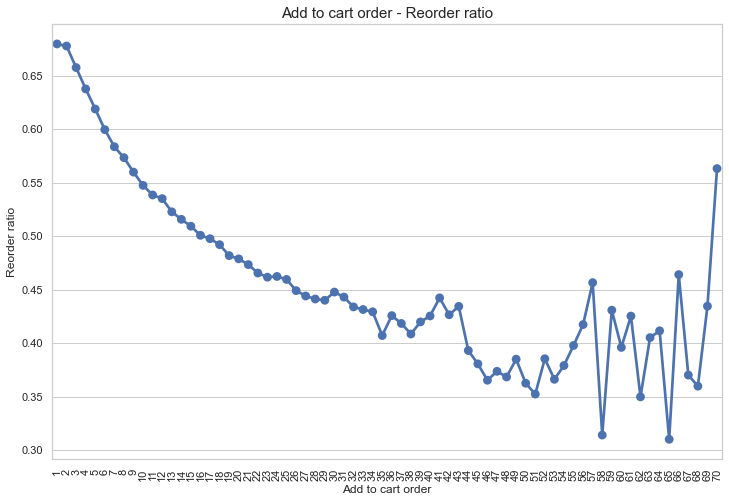

In [59]:
# how order of adding the product to the cart affects the reorder ratio
op_merged["add_to_cart_order_mod"]=op_merged["add_to_cart_order"].copy()
op_merged["add_to_cart_order_mod"].loc[op_merged["add_to_cart_order_mod"]>70] = 70
grouped_df = op_merged.groupby(["add_to_cart_order_mod"])["reordered"].aggregate("mean").reset_index()

plt.figure(figsize=(12,8))
sns.pointplot(grouped_df['add_to_cart_order_mod'].values, grouped_df['reordered'].values, alpha=0.8, color=color[0])
plt.ylabel('Reorder ratio', fontsize=12)
plt.xlabel('Add to cart order', fontsize=12)
plt.title("Add to cart order - Reorder ratio", fontsize=15)
plt.xticks(rotation='vertical')
plt.show()

Looks like the products that are added to the cart initially are more likely to be reordered again compared to the ones added later. This makes sense to me as well since we tend to first order all the products we used to buy frequently and then look out for the new products available.



# Q : When do the reorders usually occurs ? 

## By Day

In [60]:
op_merged = pd.merge(op_merged, orders_df, on='order_id', how='left')

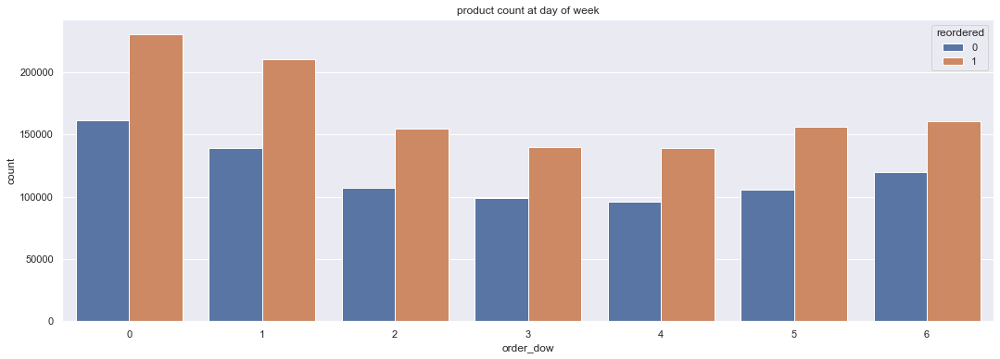

In [61]:
sns.set(font_scale =1)
plt.figure(figsize=(18,6))
ax = sns.countplot(x="order_dow", data=op_merged,hue='reordered')
plt.title('product count at day of week')
#for p in ax.patches:
        #for put value on countplot graph,In the simplest form, the text is placed at xy.
#        ax.annotate(p.get_height(), (p.get_x(), p.get_height()+5))
plt.show()

Assuming that the week starts from Sunday, most shopping is done on Sundays and Mondays. Also least orders were placed on Thursday. People tend to restock there supplies on Sundays.
Reorders w.r.t to days of week is proportionally same as all orders.



/Users/lilou_dgt/opt/anaconda3/envs/DSAA/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



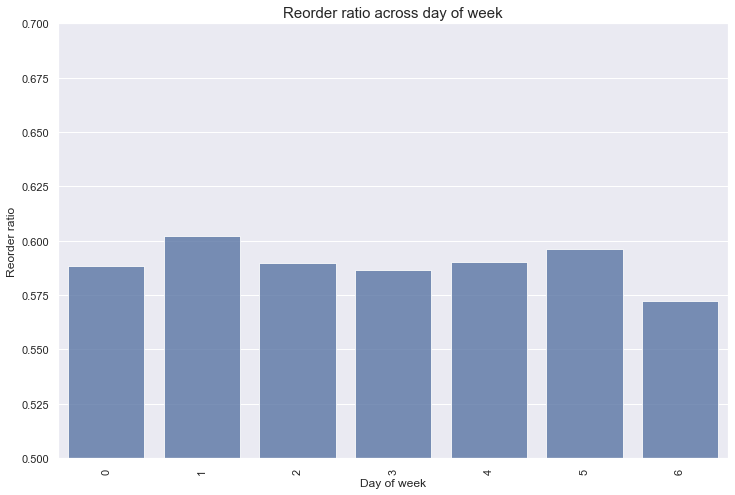

In [62]:
order_products_train_df = pd.merge(order_products_df, orders_df, on='order_id', how='left')
grouped_df = order_products_train_df.groupby(["order_dow"])["reordered"].aggregate("mean").reset_index()

plt.figure(figsize=(12,8))
sns.barplot(grouped_df['order_dow'].values, grouped_df['reordered'].values, alpha=0.8, color=color[0])
plt.ylabel('Reorder ratio', fontsize=12)
plt.xlabel('Day of week', fontsize=12)
plt.title("Reorder ratio across day of week", fontsize=15)
plt.xticks(rotation='vertical')
plt.ylim(0.5, 0.7)
plt.show()

## By Hour

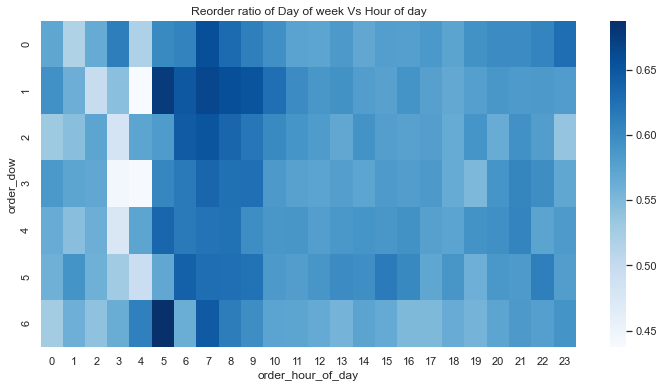

In [63]:
grouped_df = order_products_train_df.groupby(["order_dow", "order_hour_of_day"])["reordered"].aggregate("mean").reset_index()
grouped_df = grouped_df.pivot('order_dow', 'order_hour_of_day', 'reordered')

plt.figure(figsize=(12,6))
sns.heatmap(grouped_df, cmap="Blues")

plt.title("Reorder ratio of Day of week Vs Hour of day")
plt.show()

Looks like reorder ratios are quite high during the early mornings compared to later half of the day.

In [64]:
order_products_train_df.groupby(['order_dow', 'order_hour_of_day'])["reordered"].aggregate("mean").iplot()
#order_products_train_df.groupby(['order_dow', 'order_hour_of_day']).agg({'reordered' : 'count'}).iplot()